In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [ ]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *


In [12]:
# !ls

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id':"1BCqjhvI9k6h65qM6ZLTwXgdzRVH08tFD"})   # replace the id with id of file you want to access
downloaded.GetContentFile('WSI_PATCHES.7z')   

In [20]:
# !mkdir /WSI_PATCHES
# !cp WSI_PATCHES.7z /WSI_PATCHES
%cd /WSI_PATCHES
!ls

/WSI_PATCHES
WSI_PATCHES.7z


In [19]:
%cd WSI_PATCHES
!ls

/content/WSI_PATCHES


In [22]:
# !p7zip -d WSI_PATCHES.7z
!ls

WSI_PATCHES


In [ ]:
data_dir = Path('./WSI_PATCHES/Mitosis_1class_768_1slide')


In [ ]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [ ]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=80,
    classes=len(class_map),
    class_map=class_map,
    size=384,
    size_trans=512,
    batch_size=5,
    learning_rate=3e-2,
    architecture="CNN",
    model='tf_efficientdet_d2'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = "EffDet_SmallDS_2_" + str(params['size']) +"_"+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [ ]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


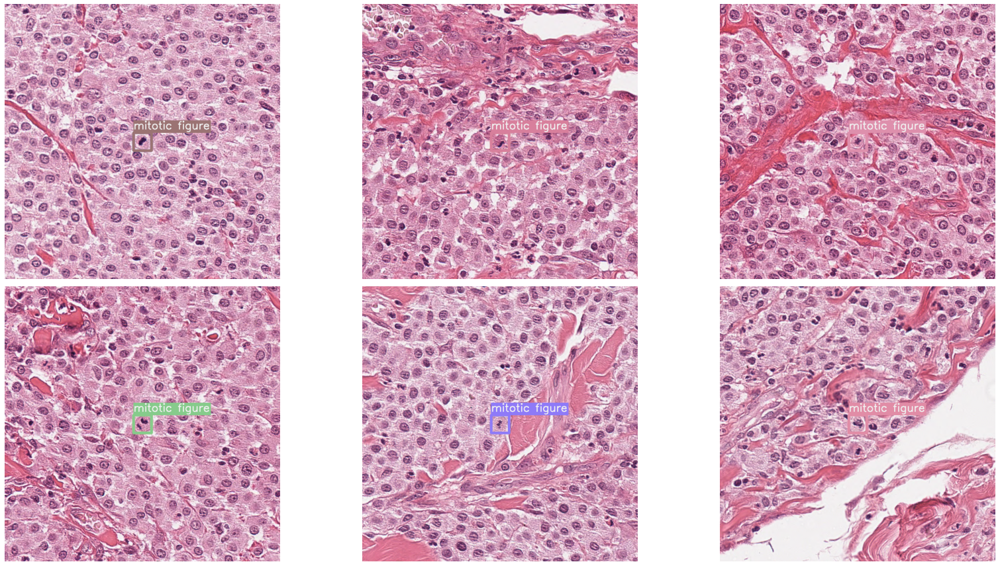

In [ ]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [ ]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [ ]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

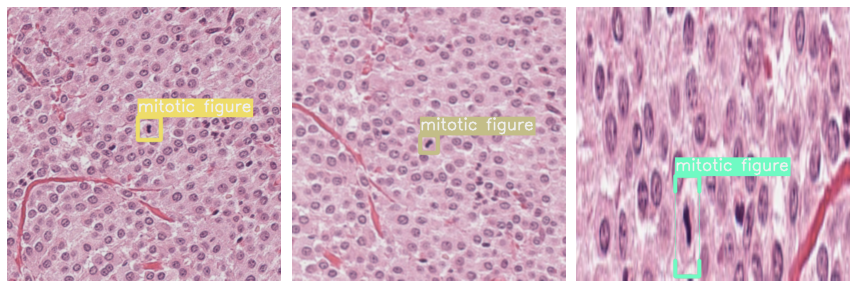

In [ ]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [ ]:
# DataLoaders
train_dl = efficientdet.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

5

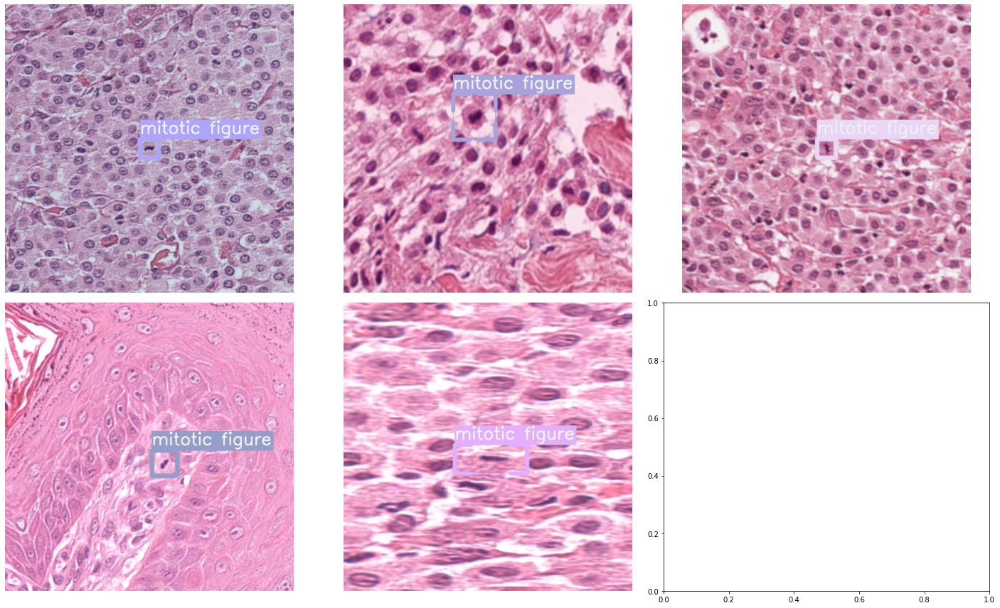

In [ ]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [ ]:
#Hypermater config for Wandb sweep
sweep_config = {
  "name": params['wandb_run_name'],
  "method": "grid",
  "parameters": {
        'epochs': {
            "values": [params['epochs']]
        },
        'batch_size':{
          'values':[params['batch_size']]
        },
        'learning_rate':{'values':[params['learning_rate']]
        },
        'optimizer': {
            'values': ['adam', 'nadam', 'sgd', 'rmsprop']
        },
        'activation': {
            'values': ['relu', 'elu', 'selu', 'softmax']
        },
        'train_ds_size': {
            'values':[params['train_ds_size']]
        }
    }
}
# sweep_id = wandb.sweep(sweep_config, entity='user', project='mitosis_01')
# print(sweep_config)

In [ ]:
#EfficeientDet Model Config
model = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)

#Additional Models: tf_efficientdet_lite0

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [ ]:
#WanDB Config
# wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
# config = wandb.config

wandb: Currently logged in as: bnapora (use `wandb login --relogin` to force relogin)


## Training


In [ ]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
# learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], 
#                                     model=model, 
#                                     metrics=metrics,
#                                     cbs=[WandbCallback(log_preds=True, log_dataset=False, log_model=False), SaveModelCallback()]
#                                    )

In [ ]:
learn.freeze()
# learn.lr_find()

In [ ]:
print(config.learning_rate)
print(config.epochs)

0.03
80


In [ ]:
# learn.fine_tune(10, 3e-2, freeze_epochs=10)
learn.fine_tune(80, 3e-2)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

epoch     train_loss  valid_loss  COCOMetric  time    
Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'
0         880.979797  1610.055664 0.000000    00:03     
Better model found at epoch 0 with valid_loss value: 1610.0556640625.
1         839.472351  1590.618408 0.000000    00:01     
Better model found at epoch 1 with valid_loss value: 1590.618408203125.
2         791.578979  1558.219971 0.000000    00:01     
Better model found at epoch 2 with valid_loss value: 1558.219970703125.
3         743.514343  1496.498535 0.000000    00:01     
Better model found at epoch 3 with valid_loss value: 1496.49853515625.
4         638.811218  1377.530518 0.000000    00:01     
Better model found at epoch 4 with valid_loss value: 1377.530517578125.
5         535.172302  1140.617798 0.000000    00:01     
Better model found at epoch 5 with valid_loss value: 1140.6177978515625.
6         44

In [ ]:
learn.freeze()
# learn.lr_find()

In [ ]:
learn.fine_tune(10, 3e-7)

epoch     train_loss  valid_loss  COCOMetric  time    
Could not gather input dimensions
0         0.896274    0.894037    0.072275    00:01     
Better model found at epoch 0 with valid_loss value: 0.8940367698669434.
epoch     train_loss  valid_loss  COCOMetric  time    
Could not gather input dimensions
0         0.895999    0.866962    0.087952    00:02     
Better model found at epoch 0 with valid_loss value: 0.8669623136520386.
1         0.923545    0.792973    0.133076    00:02     
Better model found at epoch 1 with valid_loss value: 0.7929733395576477.
2         0.989156    0.713175    0.149254    00:02     
Better model found at epoch 2 with valid_loss value: 0.71317458152771.
3         0.950795    0.724165    0.163096    00:02     
4         1.005272    0.693265    0.183935    00:02     
Better model found at epoch 4 with valid_loss value: 0.6932647824287415.
5         0.984093    0.738222    0.174783    00:02     
6         0.989471    0.709243    0.200592    00:02     
7  

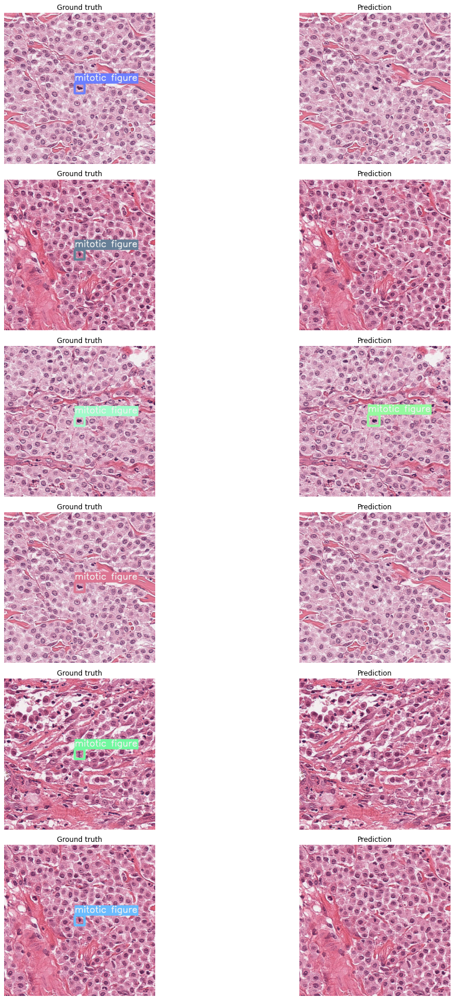

In [ ]:
efficientdet.show_results(model, valid_ds, class_map=class_map)

In [ ]:
valid_test_dl = efficientdet.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = efficientdet.predict_dl(model, valid_test_dl)

In [ ]:
wandb_images = wandb_img_preds(samples, preds, class_map, add_ground_truth=True) 

In [ ]:
wandb.log({"Predicted images": wandb_images})
wandb.join()

epoch,121
train_loss,0.94378
raw_loss,0.83946
wd_0,0.01
sqr_mom_0,0.99
lr_0,0.0
mom_0,0.9498
eps_0,1e-05
wd_1,0.01
sqr_mom_1,0.99
lr_1,0.0


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,██▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁ ▁▁▁▁
raw_loss,▇█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▁▁▁▁
wd_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▂▃▄▅▆▇██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mom_0,██▇▆▅▄▃▂▁▁██▇▅▄▃▂▁▁▁▁▁▂▂▃▃▄▅▅▆▆▇▇███▇▂▃█
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
wd_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
sqr_mom_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▁▁▂▃▄▅▆▇██▂▂▂▃▃▄▄▄▅▄▄▄▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁


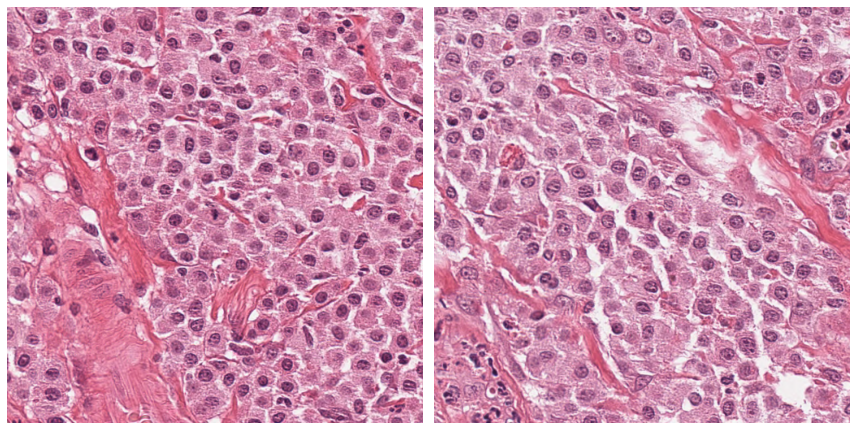

In [ ]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [ ]:
#Save model weights
torch.save(model.state_dict(), data_dir/'mitosis_tf_efficientdet_lite0.pth')

## Prediction from Saved Model

In [ ]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [ ]:
#Load Test Patches
import os
# directory = './WSI_PATCHES/MitosisTest_1024'
# directory = './WSI_PATCHES/MitosisTest_256'
directory = './WSI_PATCHES/MitosisTest_768'
# directory = '/home/bnapora/development/ml-pipeline/WSI_PATCHES/Mitosis01_256/test_patches_1024'
images = []

for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        imgfile = os.path.join(directory, filename)
        images.append(open_img(imgfile))
    else:
        continue
images = np.array(images)
images.shape

(2, 768, 768, 3)

In [ ]:
print('size=',size)
print('size_trans=',size_trans)

size= 384
size_trans= 512


In [ ]:
#Transforms used on train/valid ds
# valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [ ]:
#Load Saved Model
model2 = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)
state_dict = torch.load(data_dir/'mitosis_tf_efficientdet_lite0.pth')
model2.load_state_dict(state_dict)
# model2.cpu()  #Don't seem to need to indicate cpu()

<All keys matched successfully>

In [ ]:
infer_dl = efficientdet.infer_dl(infer_ds, batch_size=1)
samples_inf, preds_inf = efficientdet.predict_dl(model=model2, infer_dl=infer_dl)

In [ ]:
# Check to see if predicitons were made
# preds_inf

(512, 512, 3)


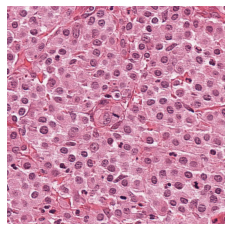

In [ ]:
for sample in samples_inf:
    imgs = sample['img']
print(imgs.shape)
show_sample(samples_inf[0])

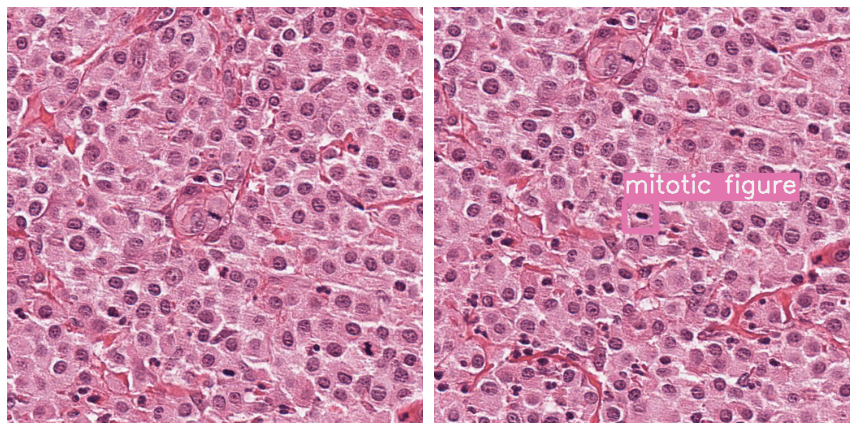

In [ ]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)